In [2]:
import os
import sys
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import pandas as pd
import umap
from sklearn import datasets
from sklearn import manifold

In [14]:
# path setting
path = os.path.abspath(os.path.dirname(os.getcwd()))
param_path = path + "\\aspect-ratio-parameters"
plot_path = path + "\\aspect-ratio-plots"

In [15]:
# Hangliang's Helper method
def plot_3d_shape(data, colors, title, figsize=(10, 10), set_division=False, save_path=False):
    

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(projection='3d')
    
    ax.scatter(data.T[0], data.T[1], data.T[2], c=colors)
    plt.title(title, fontsize=20)
    
    # rotate_figure
    ax.view_init(azim=-60, elev=9)
    
    if set_division != False:
        # set division in each axis scale
        ax.xaxis.set_major_locator(ticker.MultipleLocator(set_division))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(set_division))
        ax.zaxis.set_major_locator(ticker.MultipleLocator(set_division))
    
    if save_path != False:
        plt.savefig(save_path)
    plt.show()
    

def plot_2d_shape_single(datapoints, colors, title, figsize=(10, 10), set_division=False, save_path=False):
    """
    parameters
        "datapoints": Dataset used to draw the shape, a matrix with 2 columns,
        returned from sklearn manifold learning methods.
        "colors": Dataset used to color the shape; can be None.
        "title": Name of the shape.
        "figsize": size of plot, 10 * 10 as default value.
        "set_division": Choose whether set division in each axis scale;
        False as default value; if wanna set division, input real value.
        "save_path": The path for saving the plot; False as default value;
        if wanna to save plot, input absolute path for saving.
    post
        Plot and save the 2d shape, through data in "datapoints".
    """
    x, y = datapoints.T
    plt.figure(figsize=figsize)
    plt.scatter(x, y, c=colors, s=50, alpha=0.8)
    plt.title(title, fontsize=20)

    if set_division != False:
        # set division in each axis scale
        ax.xaxis.set_major_locator(ticker.MultipleLocator(set_division))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(set_division))

    if save_path != False:
        plt.savefig(save_path)
    plt.show()


def plot_2d_shape_all(datapoints, colors, title, figsize=(20, 20), set_division=False, save_path=False):
    """
    parameters
        "datapoints": Returned matrix from sklearn manifold learning methods, for plotting.
        "colors": Dataset used to color each shape; can be None.
        "title": Name of the plot.
        "figsize": size of plot, 20 * 20 as default value.
        "set_division": Choose whether set division in each axis scale;
        False as default value; if wanna set division, input real value.
        "save_path": The path for saving the plot; False as default value;
        if wanna to save plot, input absolute path for saving.
    post
        Plot and save all 2d shapes; each shape is plotted by combining first and
        another column in "datapoints".
    """
    num_of_plots = datapoints.shape[-1] - 1
    fig = plt.figure(figsize=figsize)
    
    for i in range(1, num_of_plots+1):
        sub_data = datapoints[:, [0,i]]
        x, y = sub_data.T
        ax = fig.add_subplot(math.ceil(num_of_plots/2), 2, i)
        ax.scatter(x, y, c=colors)
        ax.set_title("v0, v"+str(i))

        if set_division != False:
            # set division in each axis scale
            ax.xaxis.set_major_locator(ticker.MultipleLocator(set_division))
            ax.yaxis.set_major_locator(ticker.MultipleLocator(set_division))
    
    plt.suptitle(title, fontsize=20)
    if save_path != False:
        plt.savefig(save_path)
    plt.show()

**Swiss Roll**

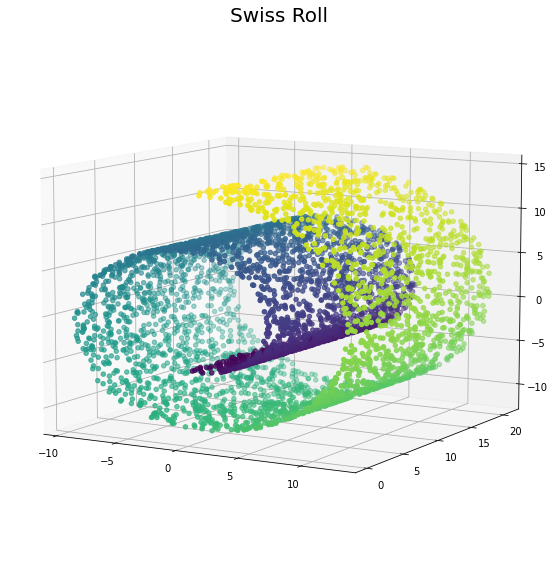

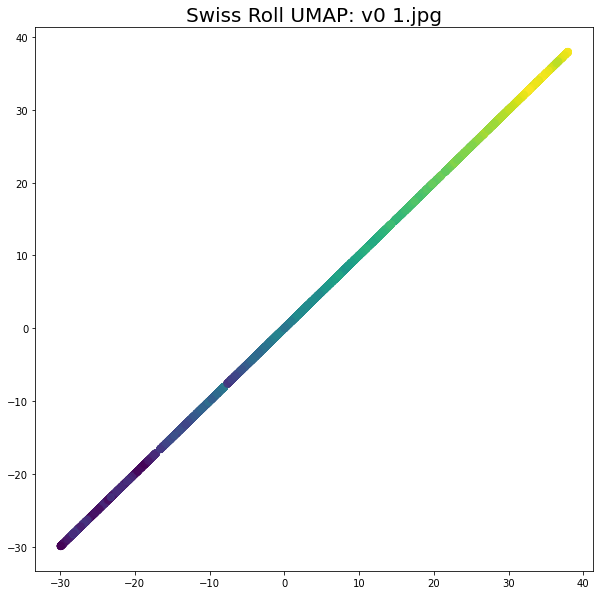

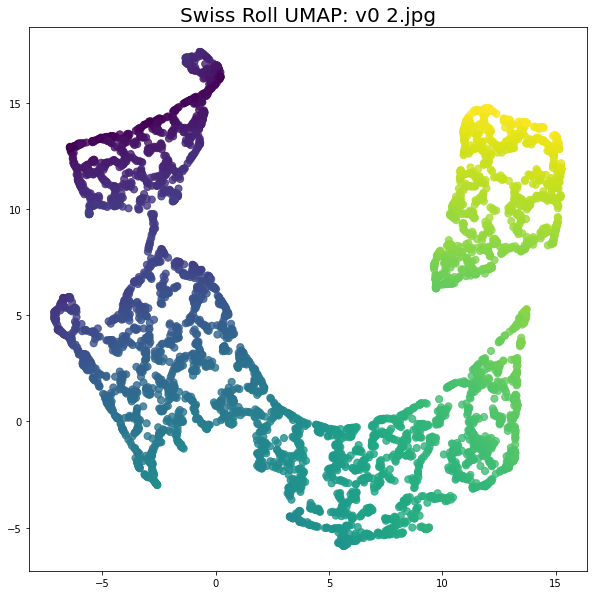

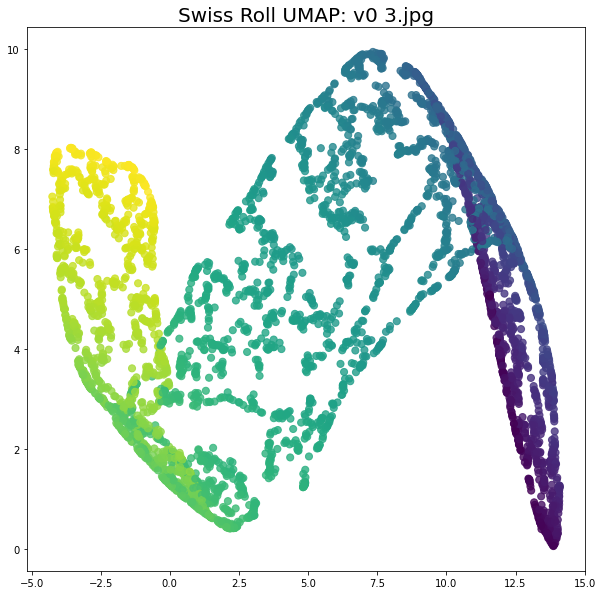

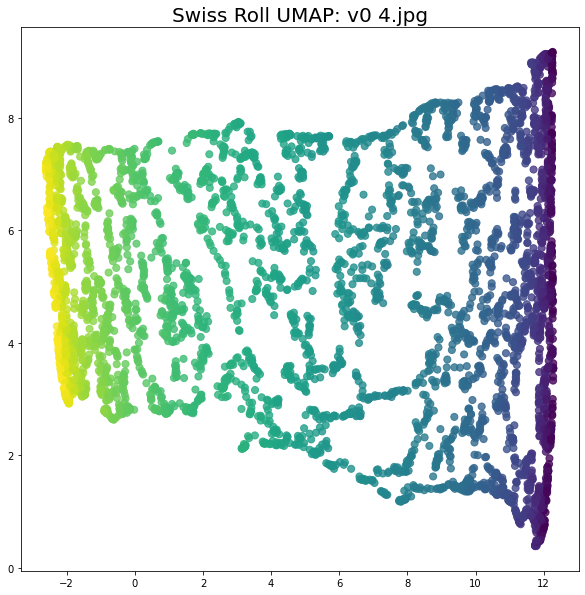

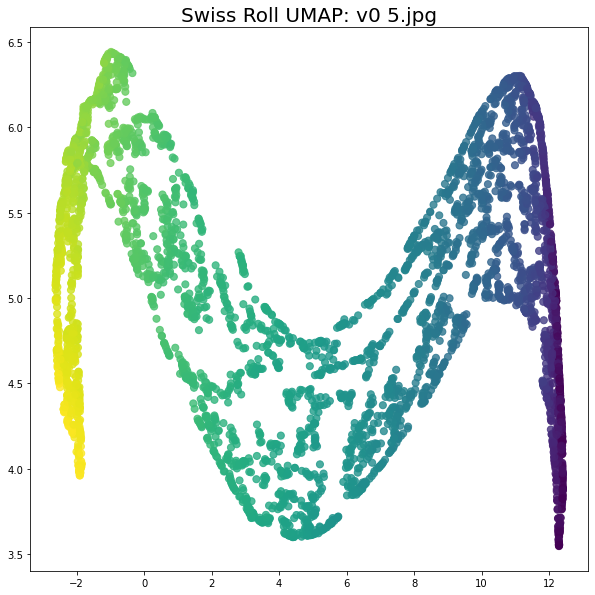

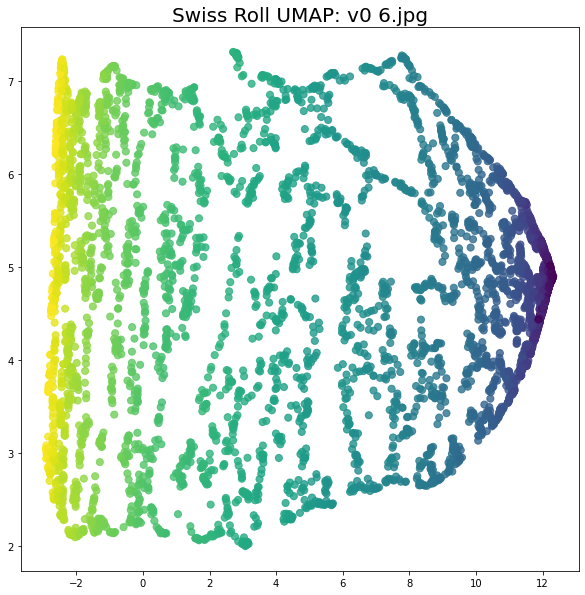

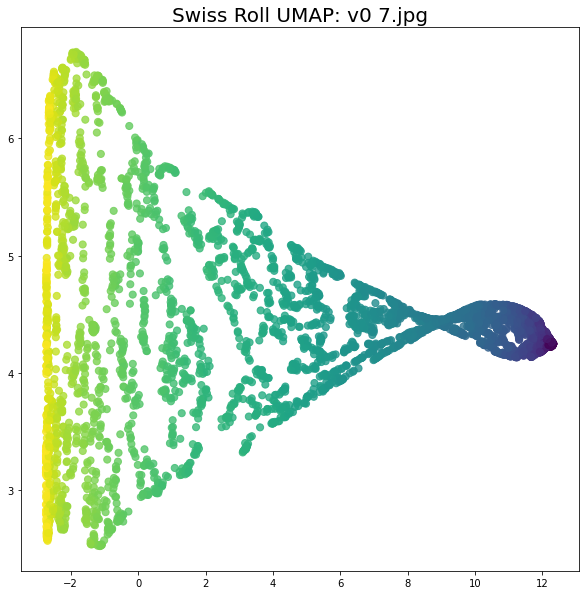

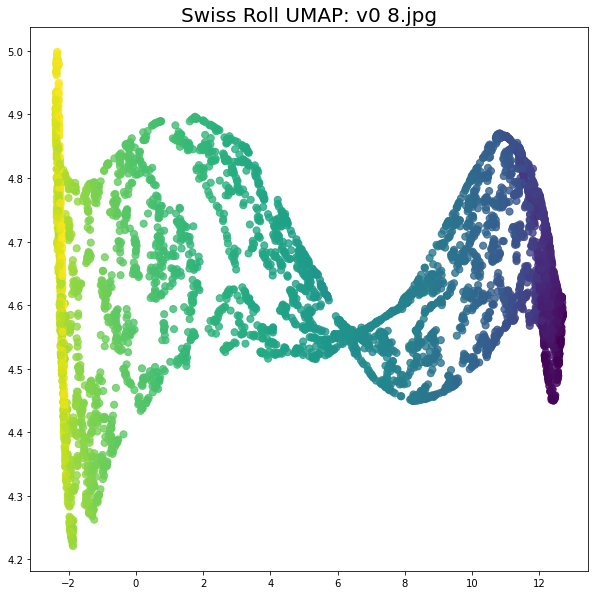

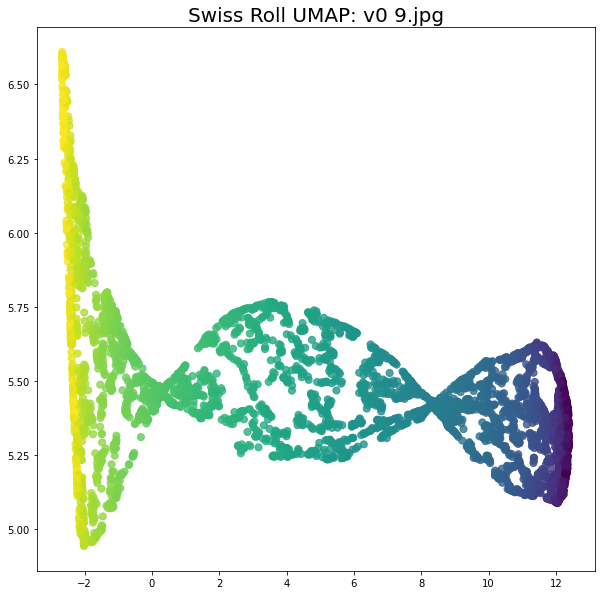

In [40]:
shape_name = "Swiss Roll"

# generate datapoints
n_samples = 5000
data, color = datasets.make_swiss_roll(n_samples=n_samples, random_state=42, noise=0)

# display and save the generated shape
plot_3d_shape(data, color, shape_name, save_path=plot_path + "\\" + shape_name + ".jpg")

# UMAP
n_neighbors = 12
n_components = 10
fit = umap.UMAP()

for i in range(1, n_components):
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = 0.1,
        n_components = i,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,i-1]], color, shape_name + " UMAP: " + "v0 " + str(i) + ".jpg")
    np.savetxt(param_path+"\\Swiss_Roll_UMAP.txt", data_umap[:, [0,1-1]])

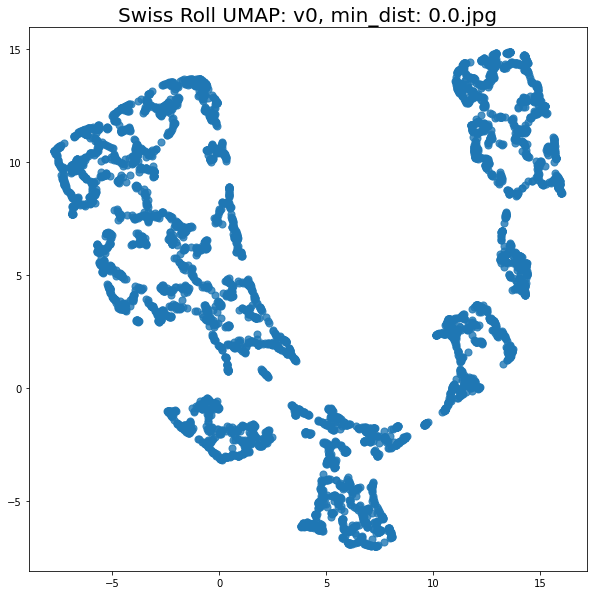

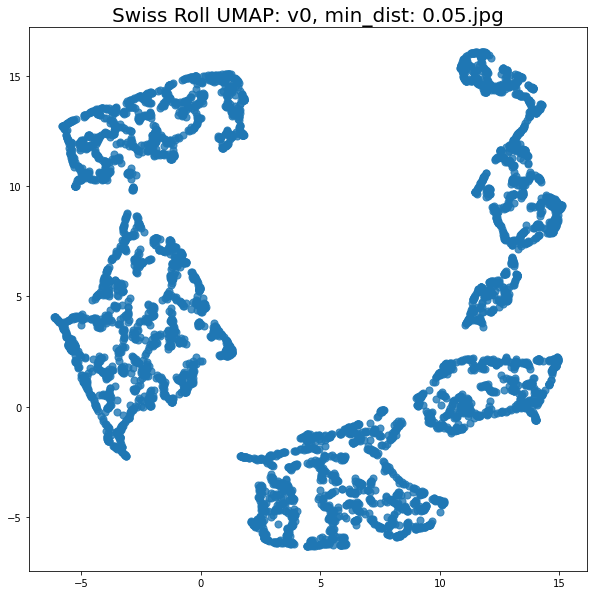

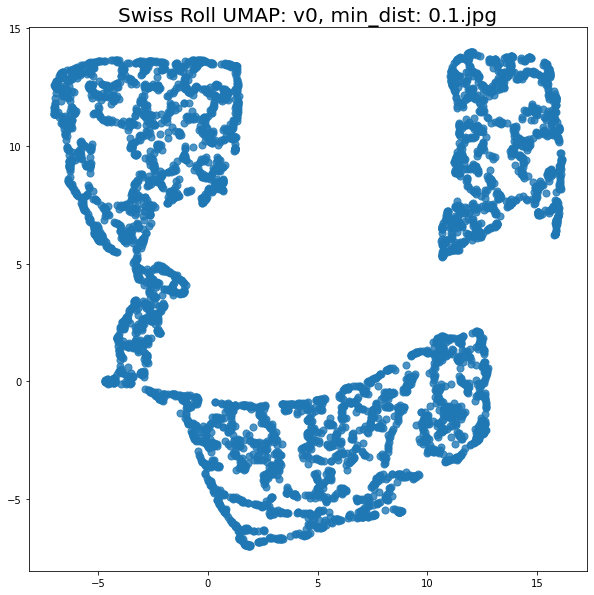

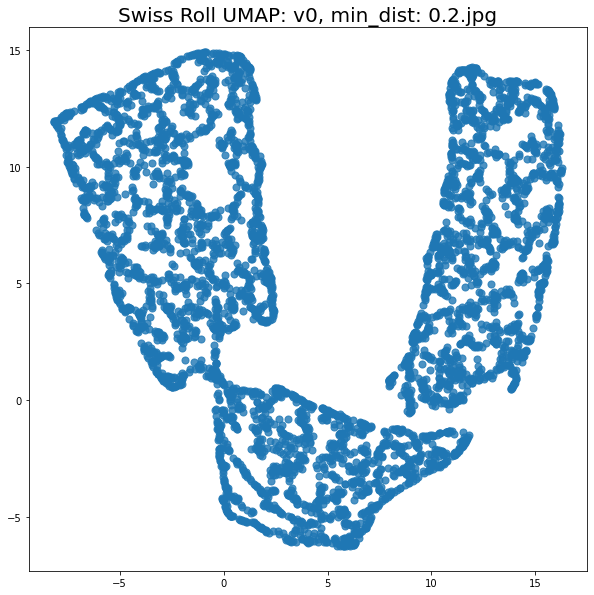

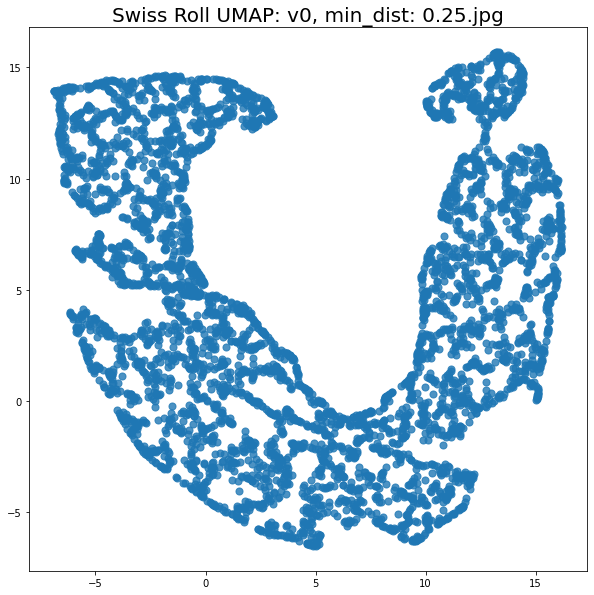

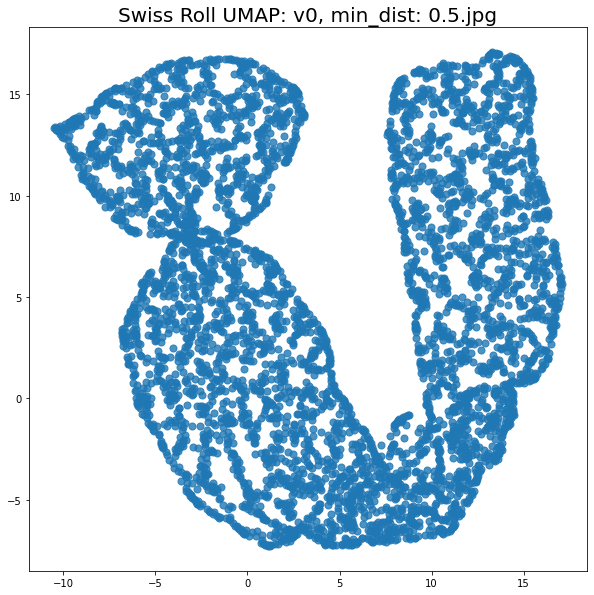

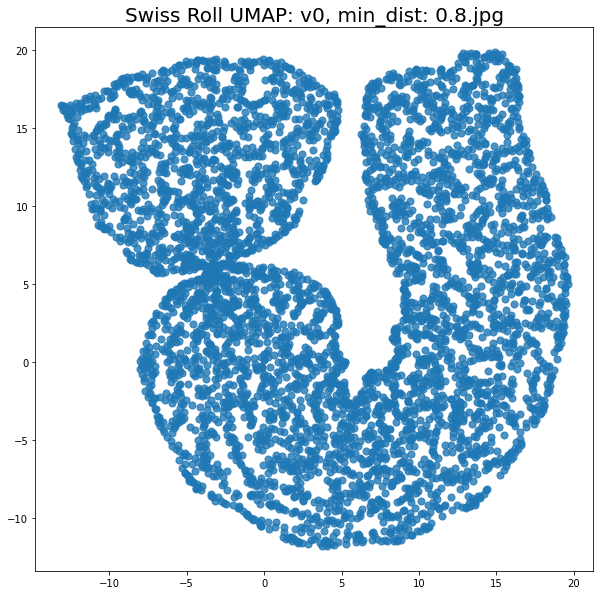

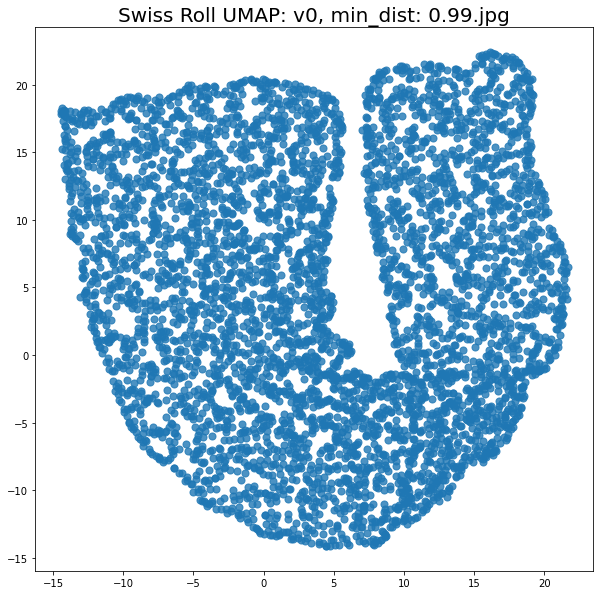

In [41]:
n_neighbors = 12
n_components = 2
min_dist = [0.0, 0.05, 0.1, 0.20, 0.25, 0.5, 0.8, 0.99]
fit = umap.UMAP()

for i in min_dist:
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = i,
        n_components = 2,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,1]], None, shape_name + " UMAP: " + "v0, " + "min_dist: " + str(i) + ".jpg")
#     np.savetxt(param_path+"\\Swiss_Roll_UMAP.txt", data_umap[:, [0,1-1]])

**Torus**

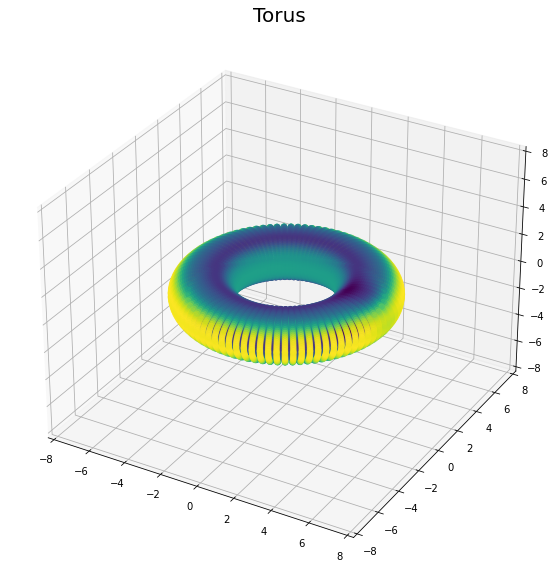

In [42]:
shape_name = "Torus"

# generate datapoints
n = 90
theta = np.linspace(0, 2.*np.pi, n)
phi = np.linspace(0, 2.*np.pi, n)
theta, phi = np.meshgrid(theta, phi)
c, a = 4, 1.5
x = (c + a*np.cos(theta)) * np.cos(phi)
y = (c + a*np.cos(theta)) * np.sin(phi)
z = a * np.sin(theta)

torus = [x, y, z]
torus = np.reshape(torus, (3,n**2))
torus = np.append(torus, [[0]*n**2]*17, 0)
xyz = np.vstack([torus[0,:], torus[1,:], torus[2,:]])
density = stats.gaussian_kde(xyz)(xyz) 
idx = density.argsort()
x, y, z, density = torus[0,:][idx], torus[1,:][idx], torus[2,:][idx], density[idx]

data = np.array([x, y, z]).T
color = -density

# display and save the generated shape
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection="3d")
ax.scatter(x, y, z, c=color, s=30, alpha=0.6)
ax.set_title("Torus", fontsize=20)
ax.axes.set_xlim3d(left=-2*c, right=2*c) 
ax.axes.set_ylim3d(bottom=-2*c, top=2*c) 
ax.axes.set_zlim3d(bottom=-2*c, top=2*c)
plt.savefig(plot_path + "\\" + shape_name + ".jpg")
plt.show()

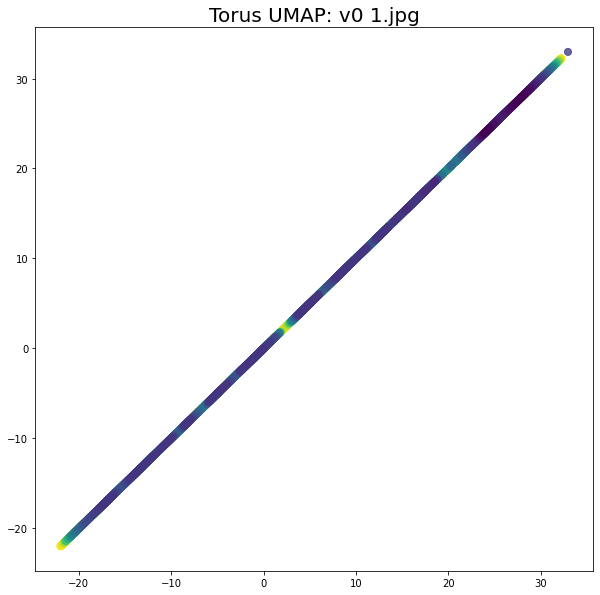

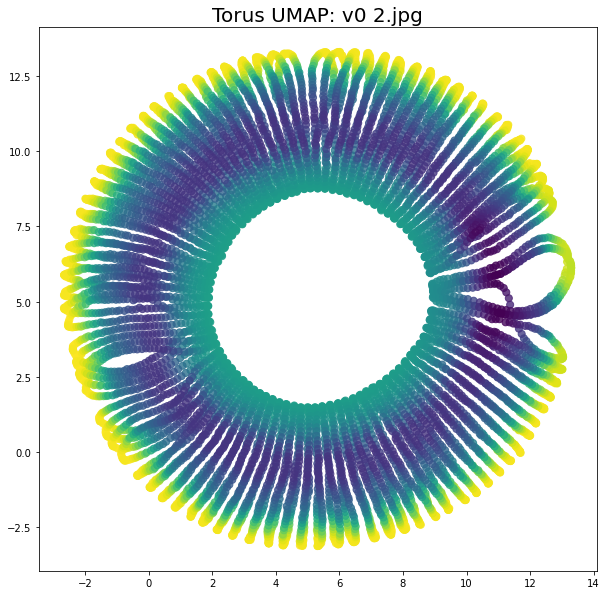

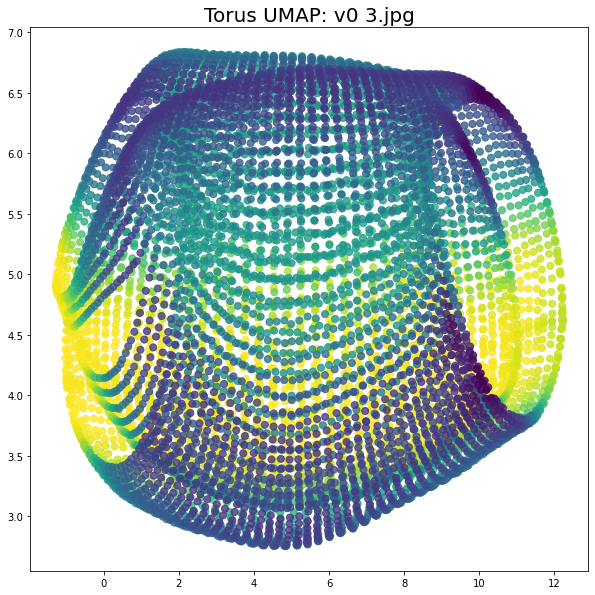

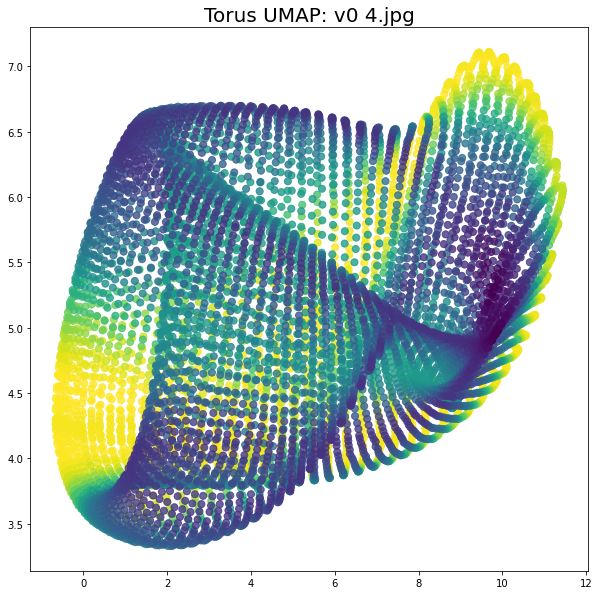

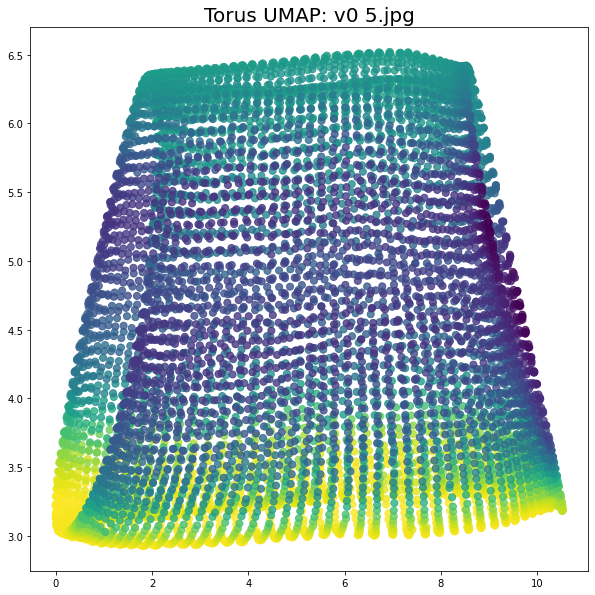

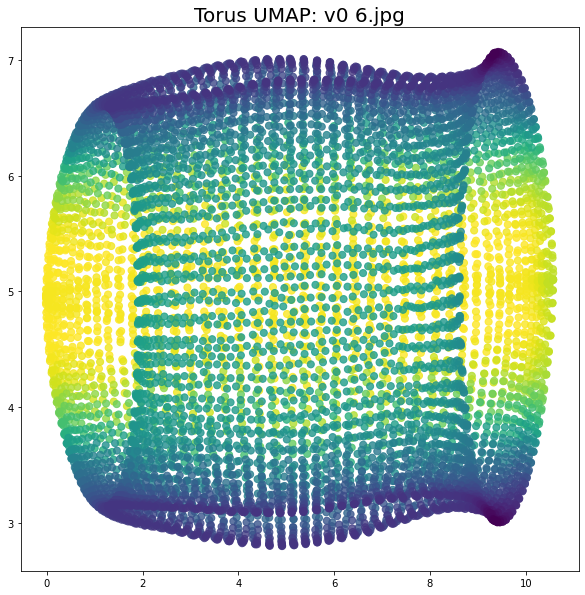

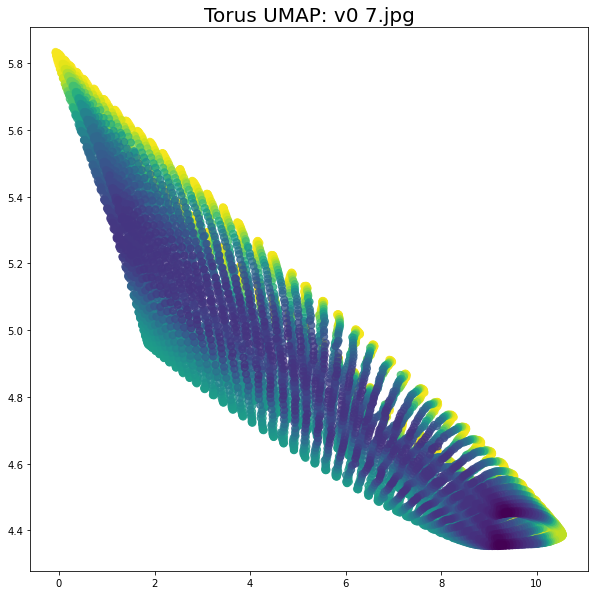

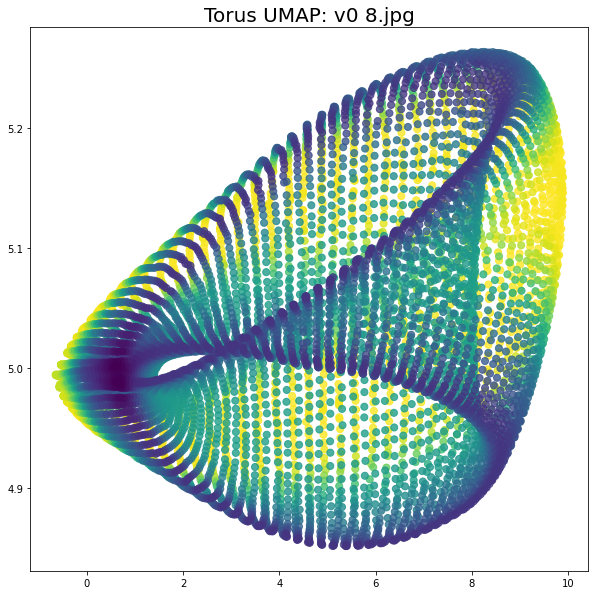

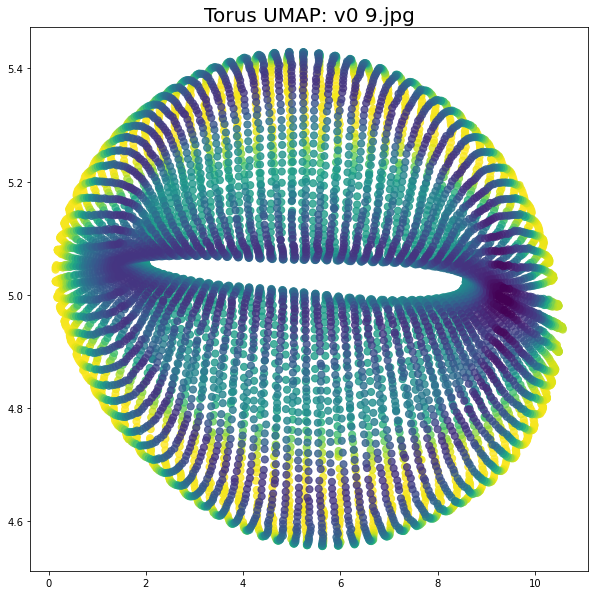

In [29]:
# UMAP
n_neighbors = 12
n_components = 10
fit = umap.UMAP()

for i in range(1, n_components):
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = 0.1,
        n_components = i,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,i-1]], color, shape_name + " UMAP: " + "v0 " + str(i) + ".jpg")
    np.savetxt(param_path+"\\Torus_UMAP.txt", data_umap[:, [0,1-1]])

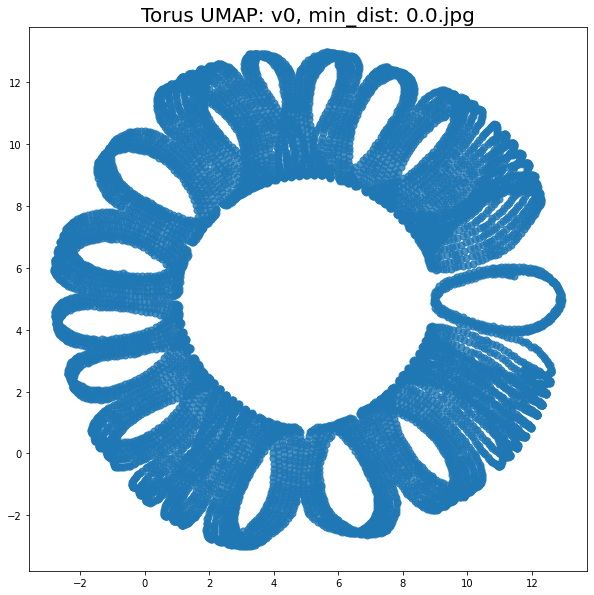

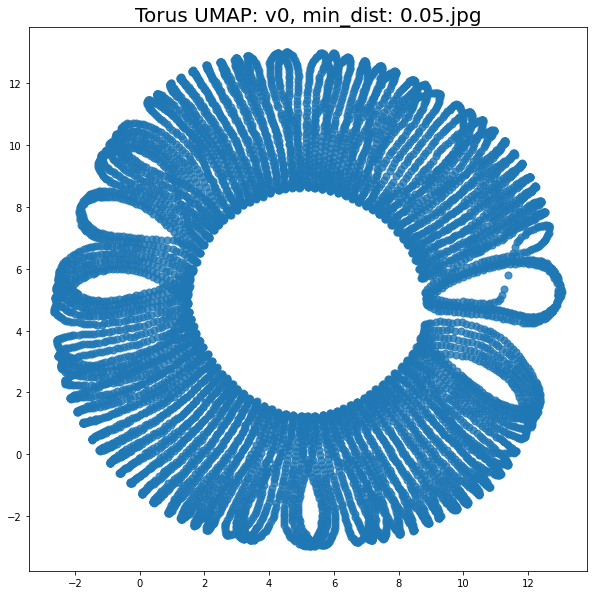

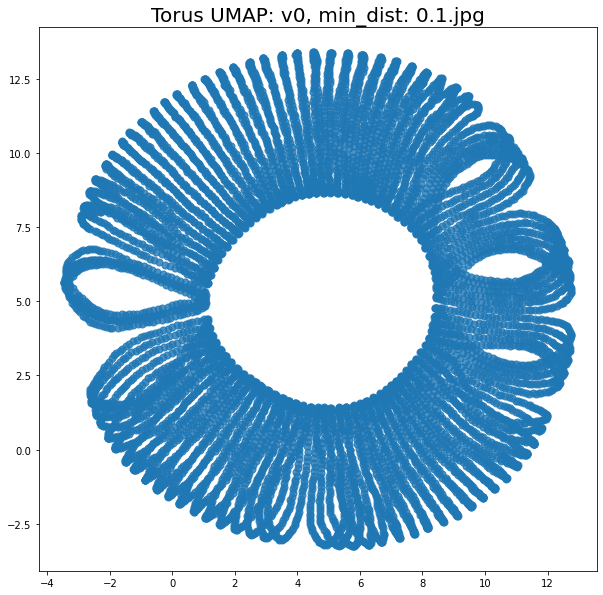

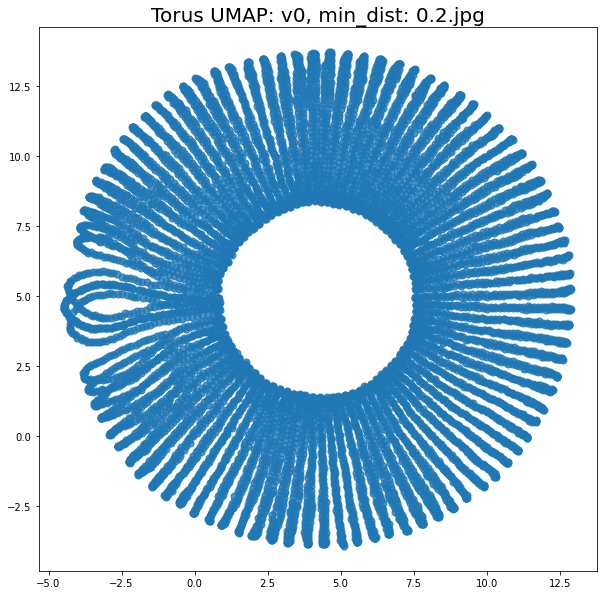

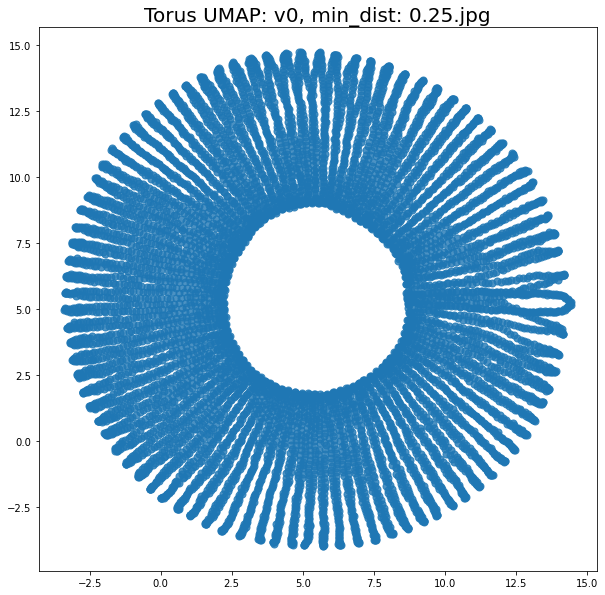

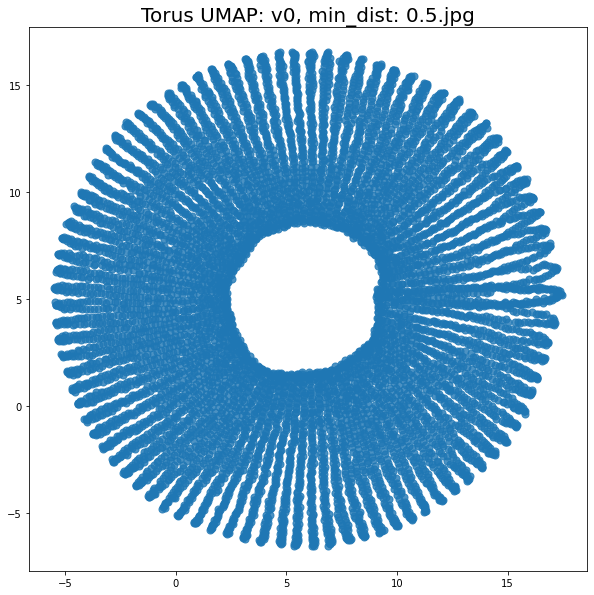

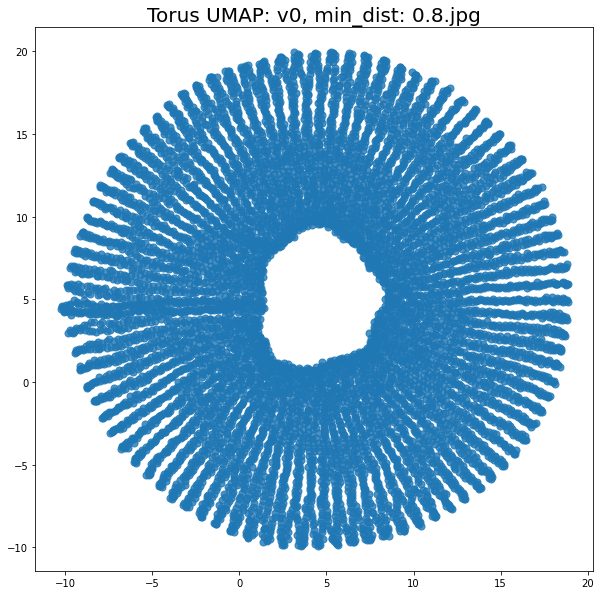

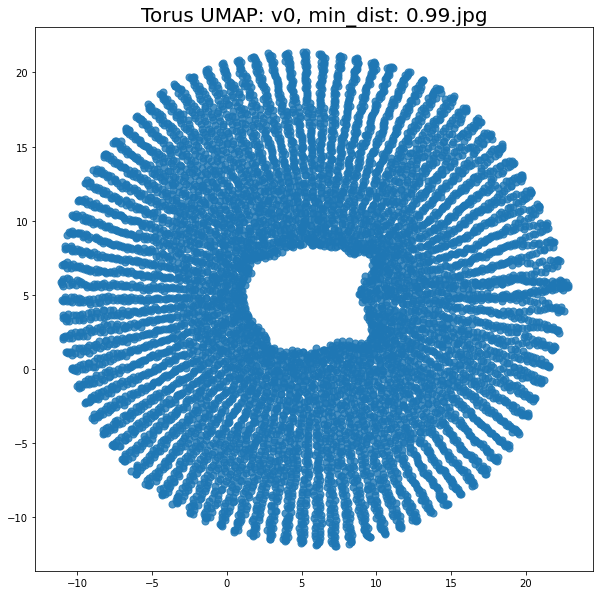

In [43]:
min_dist = [0.0, 0.05, 0.1, 0.20, 0.25, 0.5, 0.8, 0.99]
fit = umap.UMAP()

for i in min_dist:
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = i,
        n_components = 2,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,1]], None, shape_name + " UMAP: " + "v0, " + "min_dist: " + str(i) + ".jpg")
#     np.savetxt(param_path+"\\Swiss_Roll_UMAP.txt", data_umap[:, [0,1-1]])

**Circle**

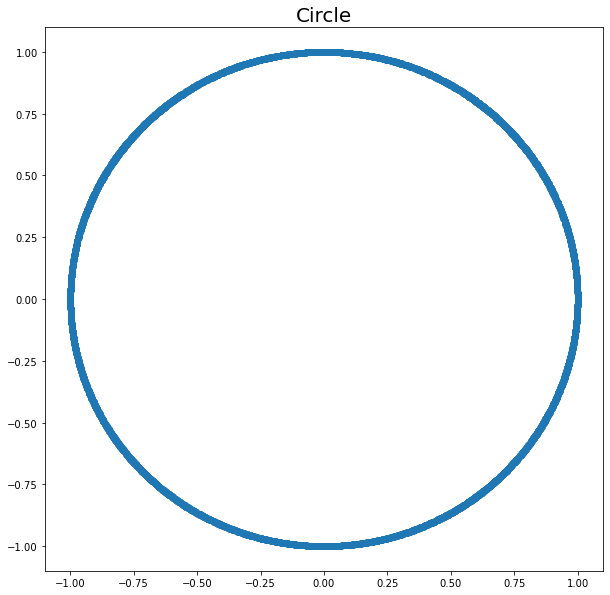

In [44]:
shape_name = "Circle"


def circle(n):
    """
    parameters
        n: number of datapoints used to generate circle
    post
        Return x, y as datapoints of a generated circle;
        x: x coordinates; y: y coordinates.
    """
    x = []
    y = []
    for i in range(0, n):
        angle = random.uniform(0,1) * (math.pi*2)
        x.append(math.cos(angle))
        y.append(math.sin(angle))
    return x, y


# generate datapoints
n = 5000
x, y = circle(n)
circle = [x, y]
circle = np.reshape(circle, (2,n))
circle = np.append(circle, [[0]*n]*18, 0)
data = circle.T

# display and save the generated shape
plt.figure(figsize=(10, 10))
plt.scatter(circle[0,:], circle[1,:])
plt.title("Circle", fontsize=20)
plt.savefig(plot_path + "\\" + shape_name + ".jpg")
plt.show()

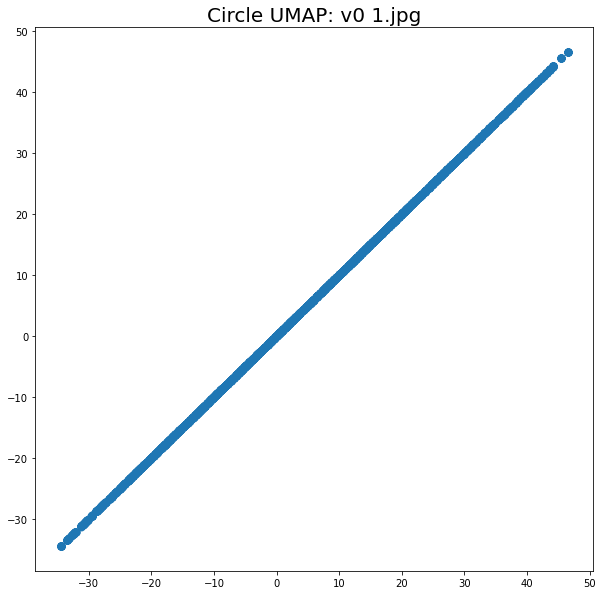

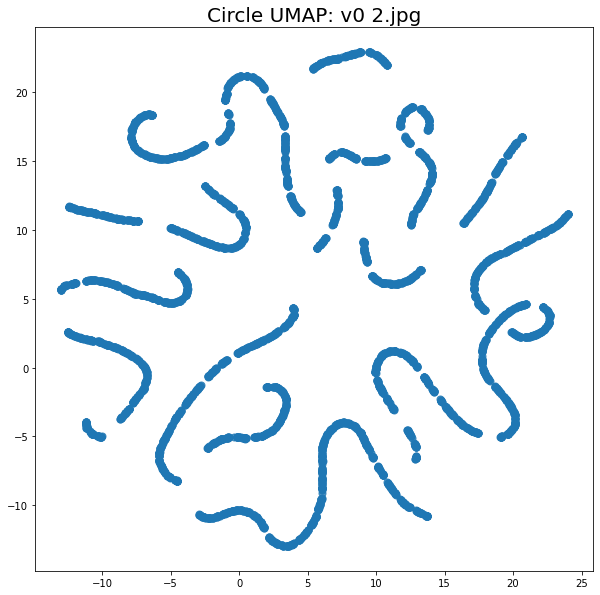

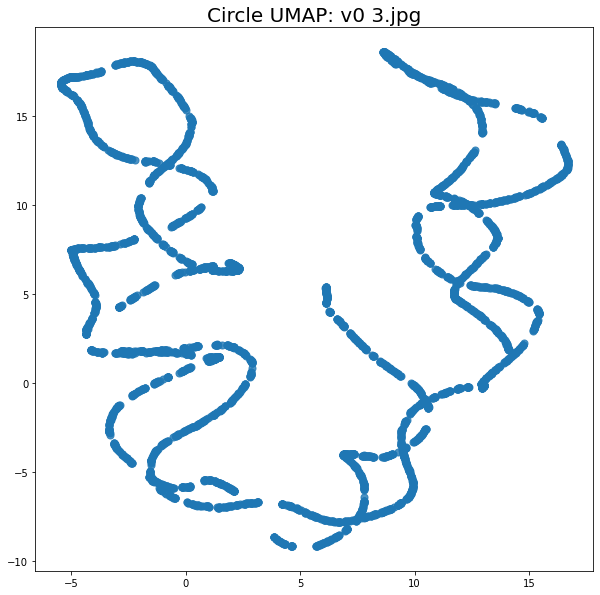

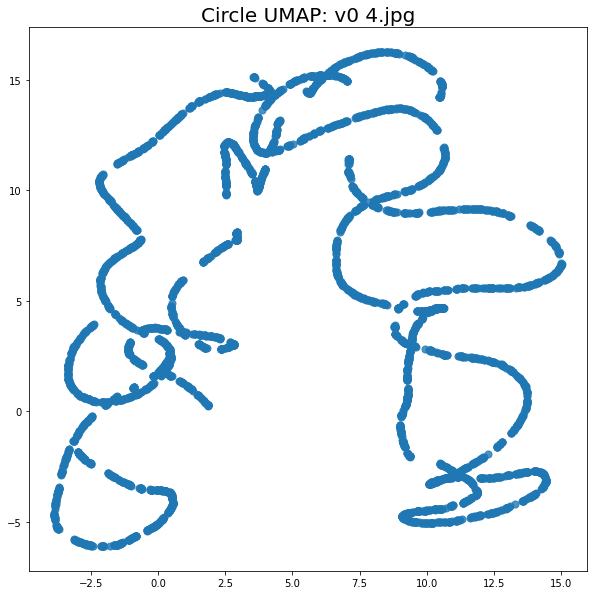

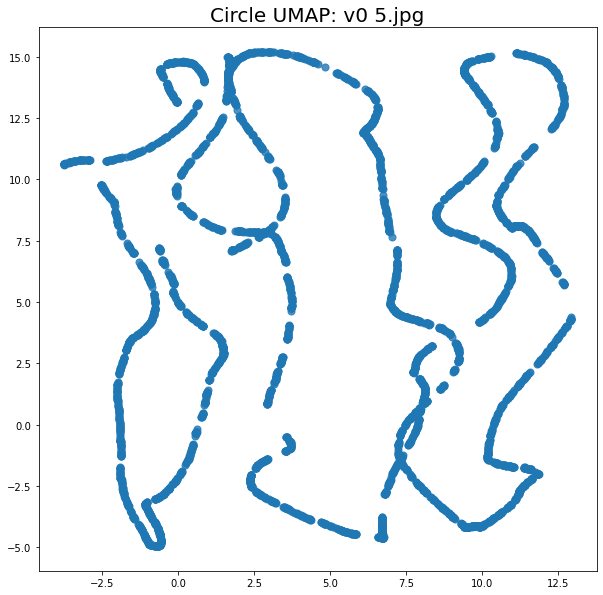

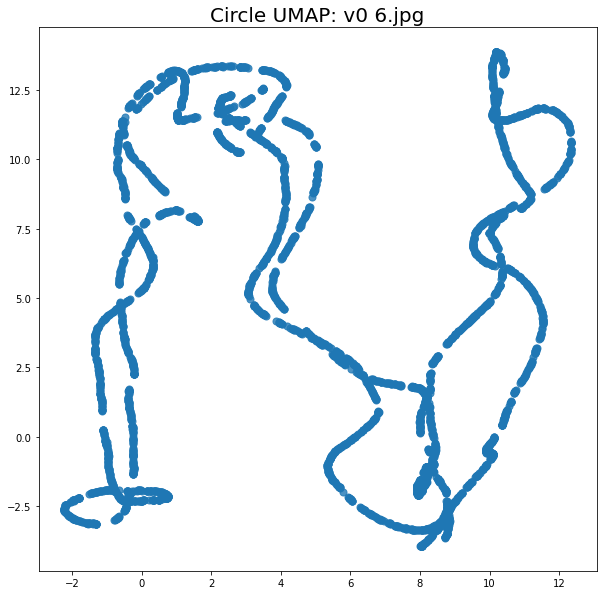

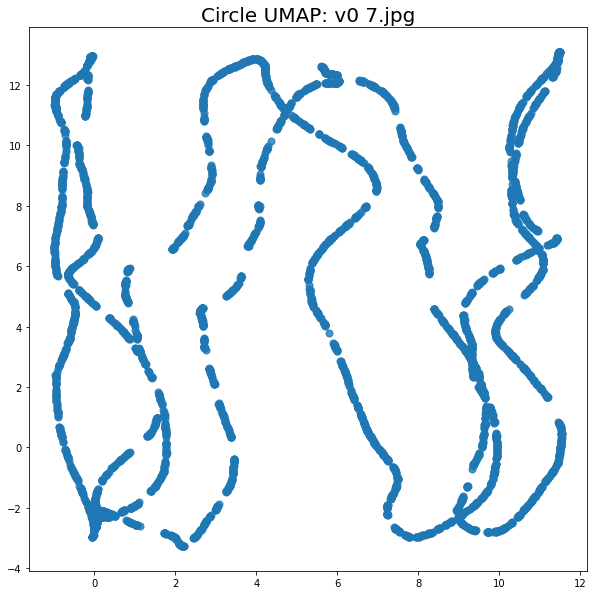

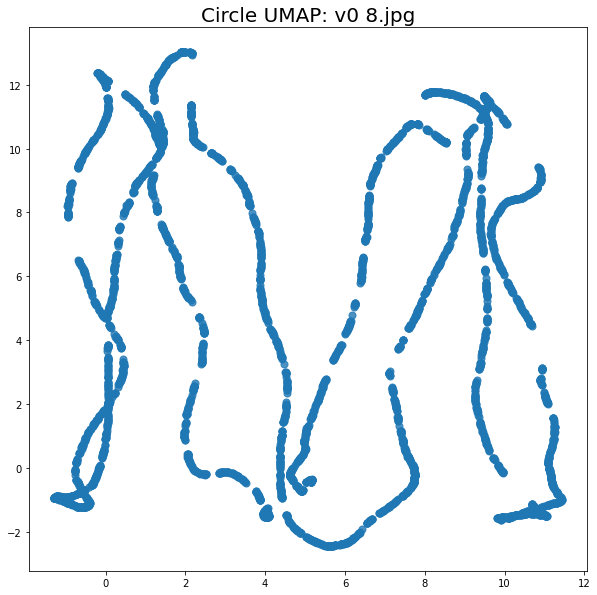

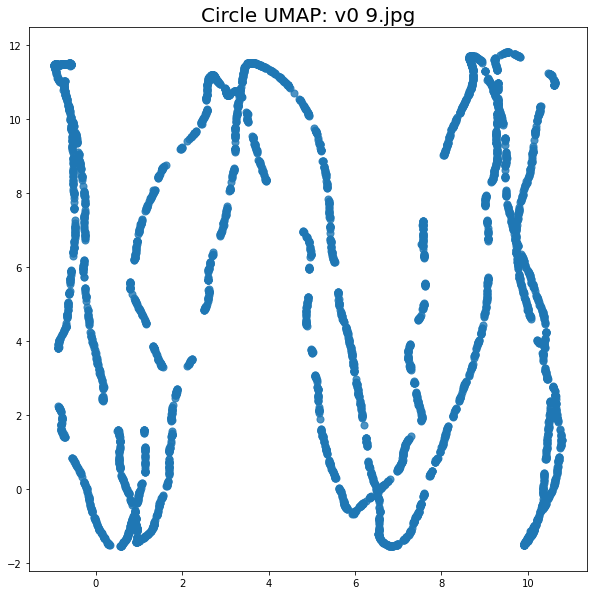

In [32]:
# UMAP
n_neighbors = 12
n_components = 10
fit = umap.UMAP()

for i in range(1, n_components):
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = 0.1,
        n_components = i,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,i-1]], None, shape_name + " UMAP: " + "v0 " + str(i) + ".jpg")
    np.savetxt(param_path+"\\Circle_UMAP.txt", data_umap[:, [0,1-1]])

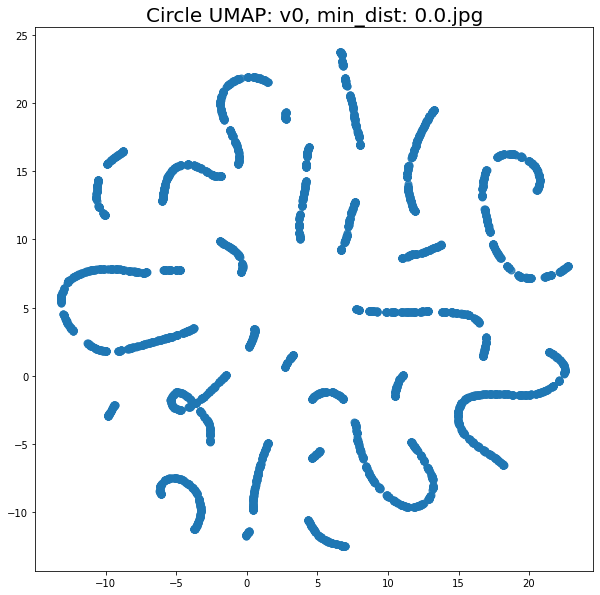

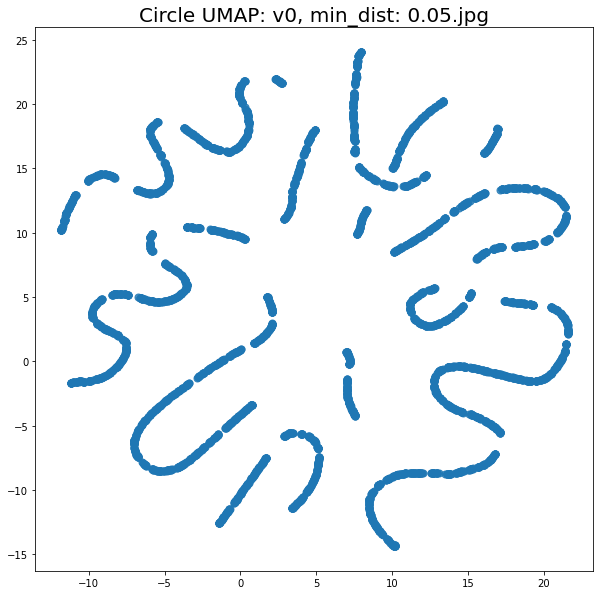

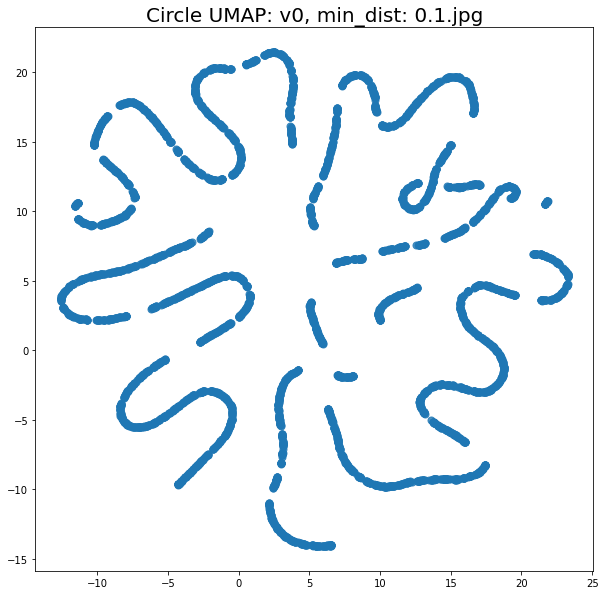

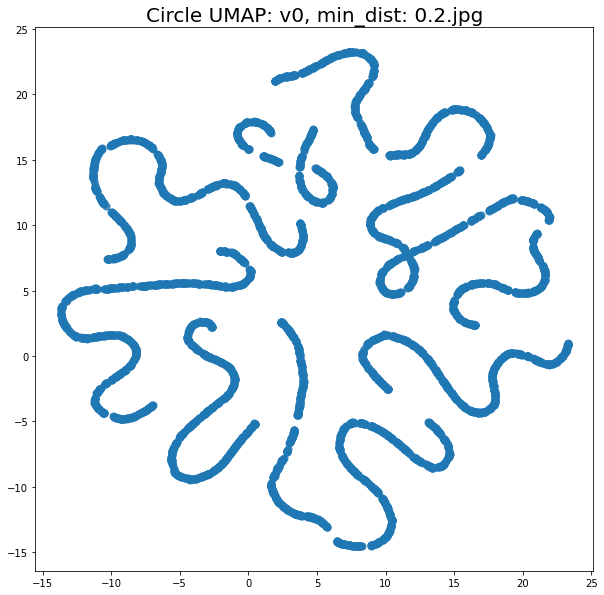

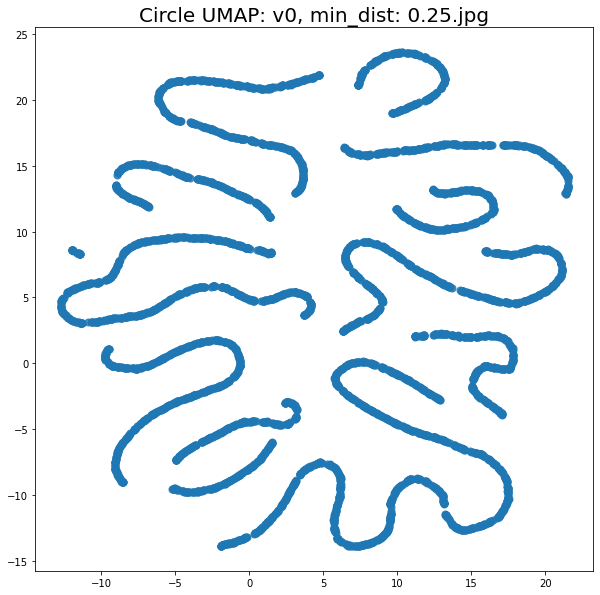

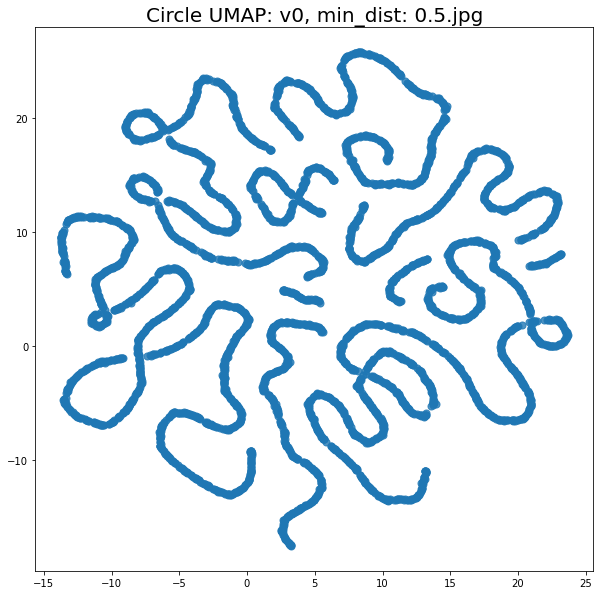

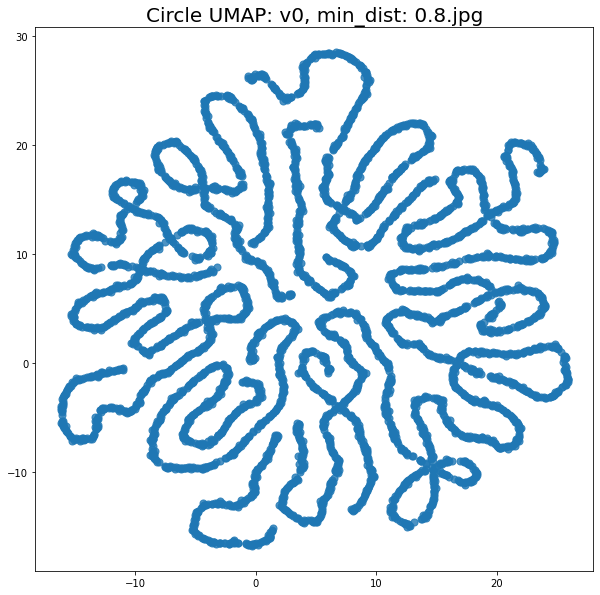

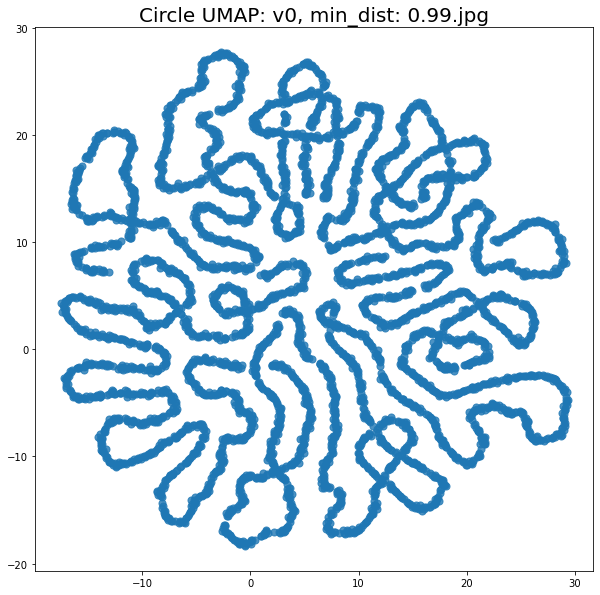

In [45]:

min_dist = [0.0, 0.05, 0.1, 0.20, 0.25, 0.5, 0.8, 0.99]
fit = umap.UMAP()

for i in min_dist:
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = i,
        n_components = 2,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,1]], None, shape_name + " UMAP: " + "v0, " + "min_dist: " + str(i) + ".jpg")
#     np.savetxt(param_path+"\\Swiss_Roll_UMAP.txt", data_umap[:, [0,1-1]])

**Rectangle**

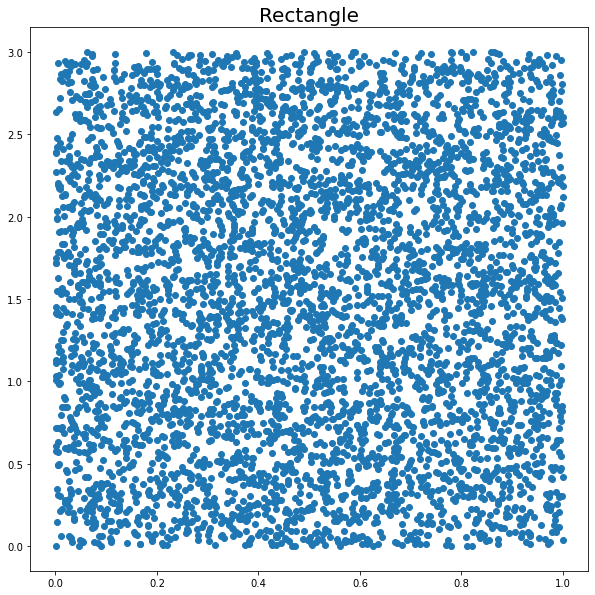

In [47]:
shape_name = "Rectangle"

# generate datapoints
n = 5000
xs = []
ys = []
for i in range(n):
    xs.append(random.uniform(0, 1))
    ys.append(random.uniform(0, 3))
data = np.array([xs, ys]).T

# display and save the generated shape
plt.figure(figsize=(10, 10))
plt.scatter(data[:,0], data[:,1])
plt.title("Rectangle", fontsize=20)
plt.savefig(plot_path + "\\" + shape_name + ".jpg")
plt.show()

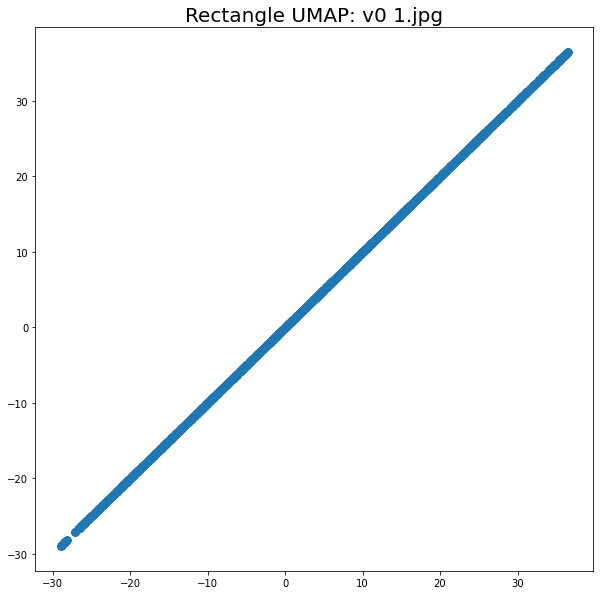

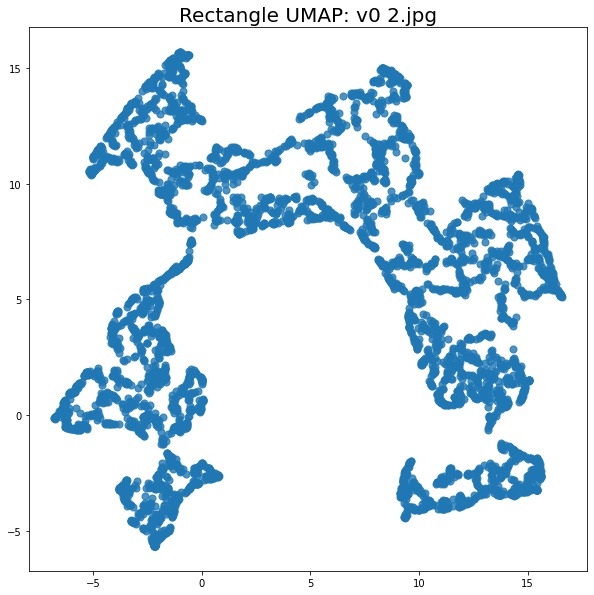

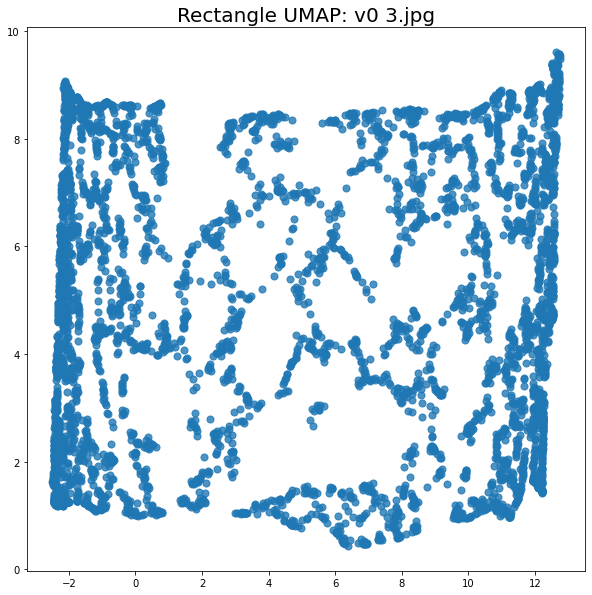

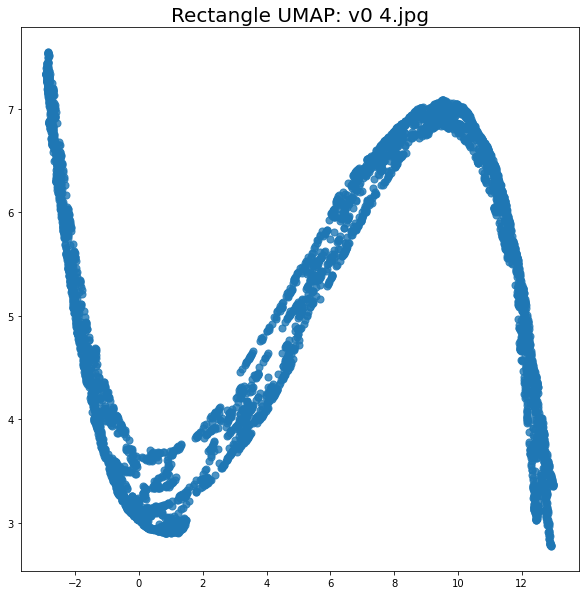

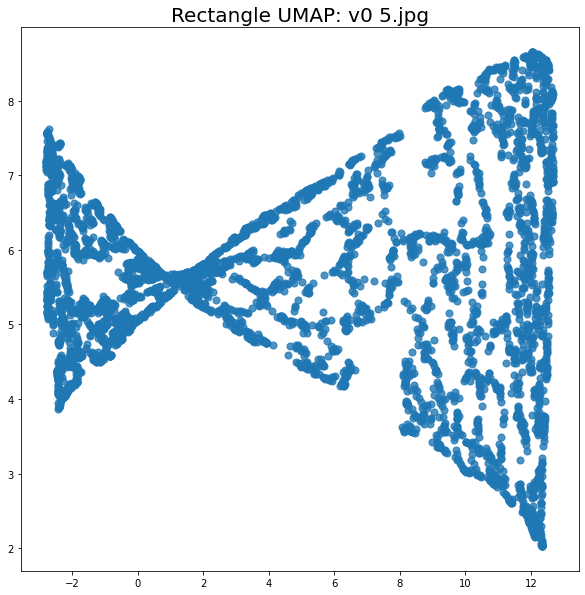

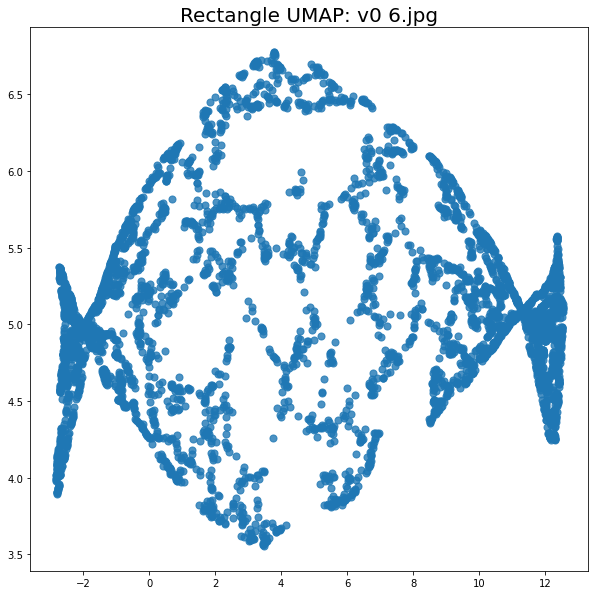

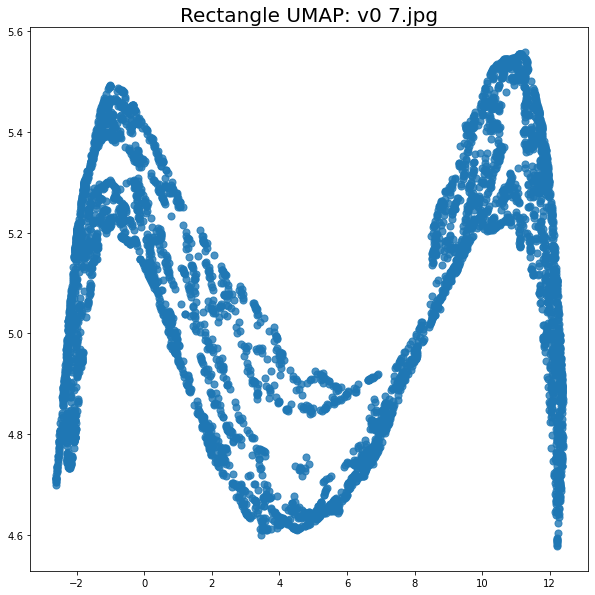

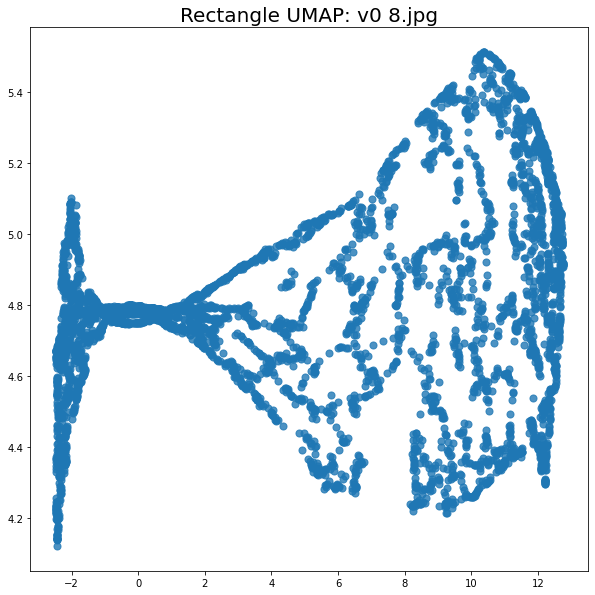

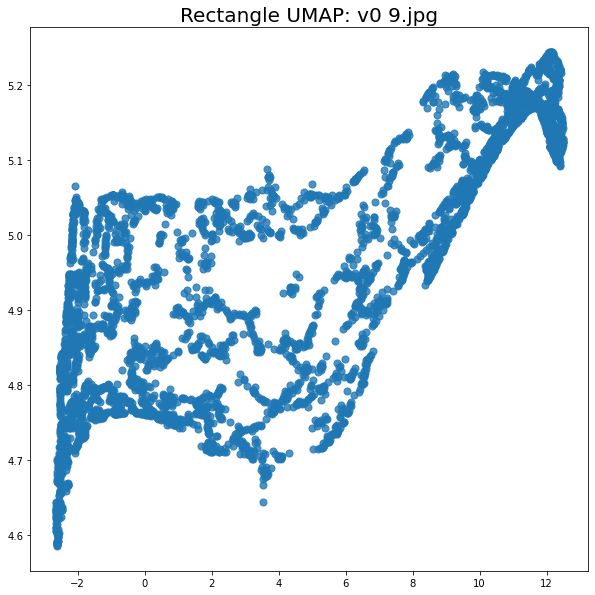

In [34]:
# UMAP
n_neighbors = 12
n_components = 10
fit = umap.UMAP()

for i in range(1, n_components):
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = 0.1,
        n_components = i,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,i-1]], None, shape_name + " UMAP: " + "v0 " + str(i) + ".jpg")
    np.savetxt(param_path+"\\Rectangle_UMAP.txt", data_umap[:, [0,1-1]])

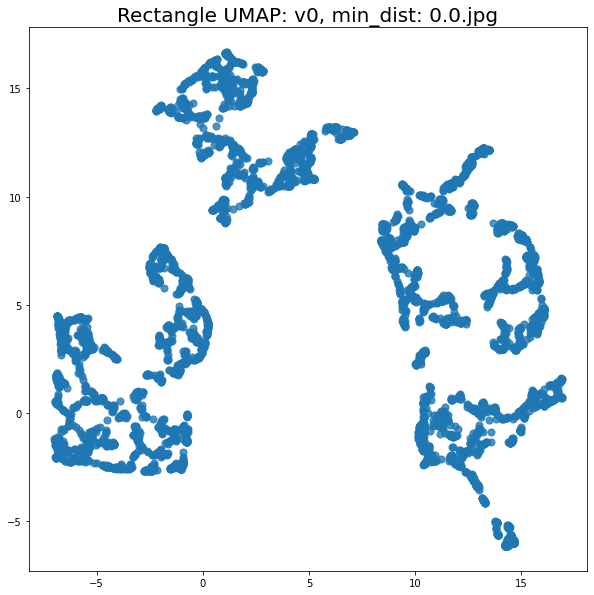

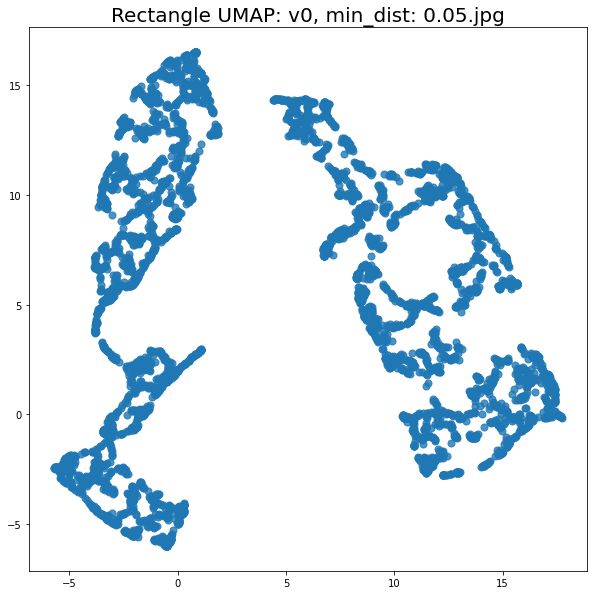

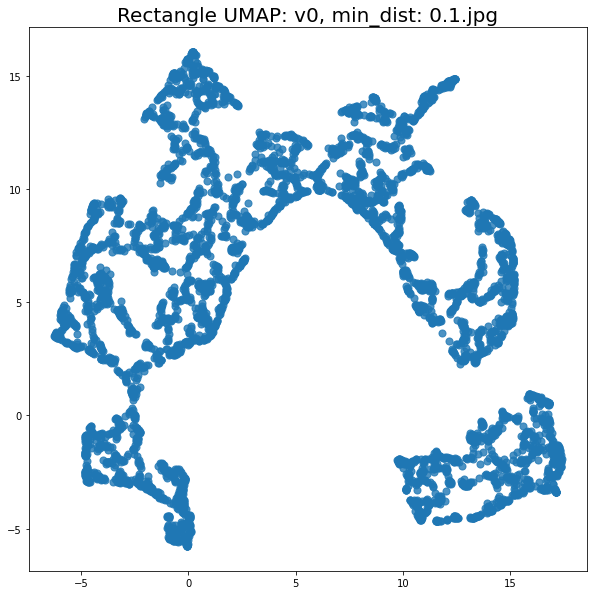

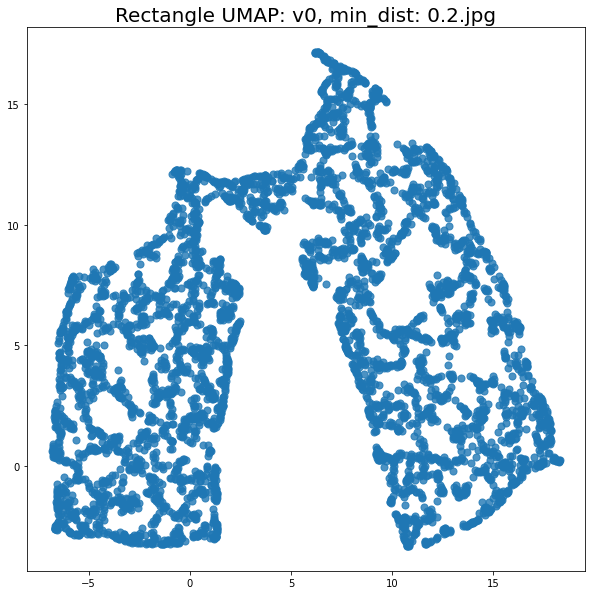

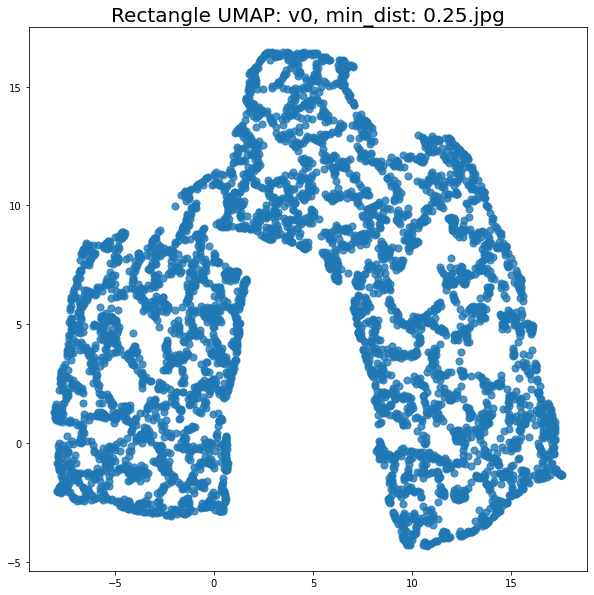

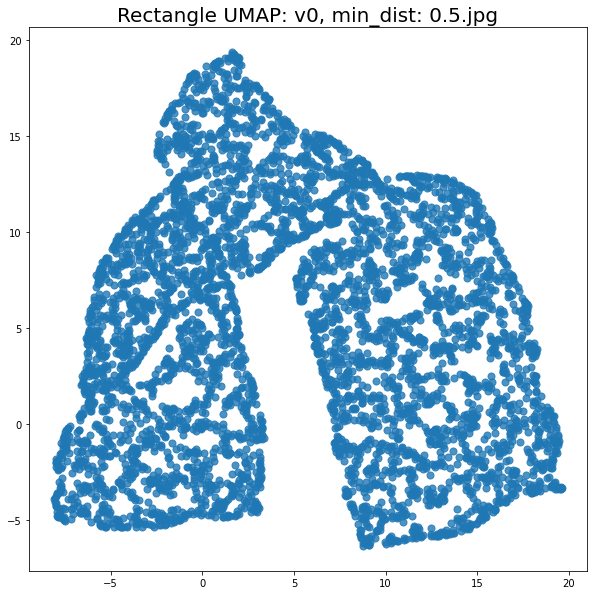

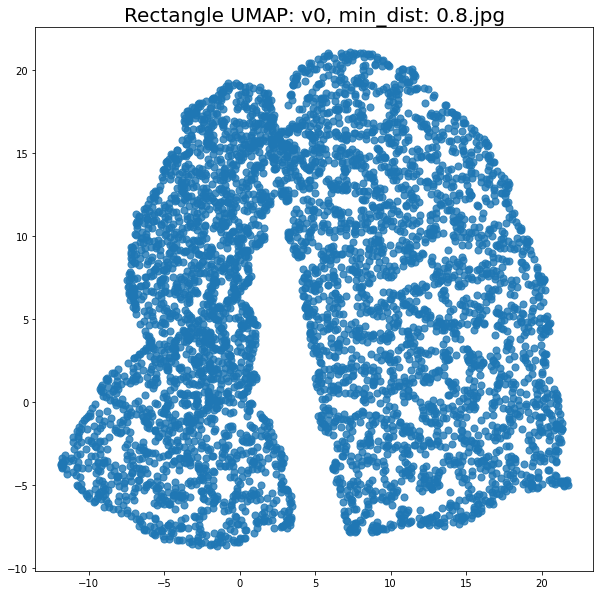

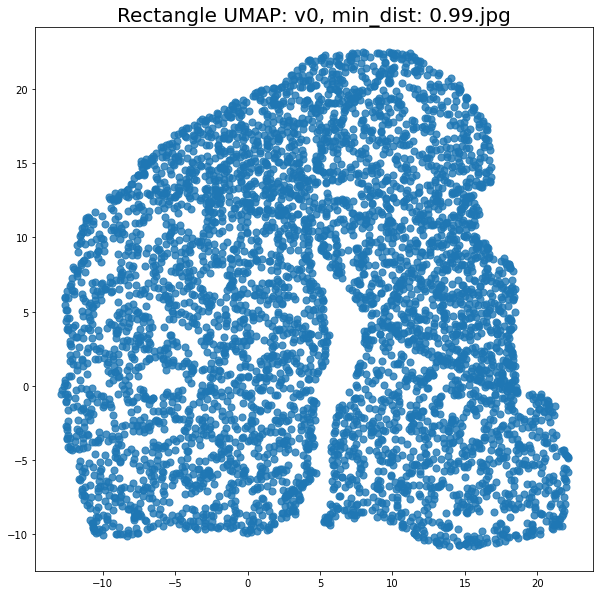

In [48]:
min_dist = [0.0, 0.05, 0.1, 0.20, 0.25, 0.5, 0.8, 0.99]
fit = umap.UMAP()

for i in min_dist:
    fit = umap.UMAP(
        n_neighbors = 15,
        min_dist = i,
        n_components = 2,
        metric="euclidean")
    data_umap = fit.fit_transform(data)
    plot_2d_shape_single(data_umap[:, [0,1]], None, shape_name + " UMAP: " + "v0, " + "min_dist: " + str(i) + ".jpg")
#     np.savetxt(param_path+"\\Swiss_Roll_UMAP.txt", data_umap[:, [0,1-1]])